# Task 3-2: Image Captioning with Transformers
You have now implemented a vanilla RNN and for the task of image captioning. In this notebook you will implement key pieces of a transformer decoder to accomplish the same task.

This task contains two sections with a score of 55 points in total.


# Section A: Vanilla Transformer

**In this section, there are a total of 7 steps, with a total score of 15 points.**

In [2]:
# Setup cell.
import time, os, json
import numpy as np
import matplotlib.pyplot as plt

from mml.gradient_check import eval_numerical_gradient, eval_numerical_gradient_array
from mml.transformer_layers import *
from mml.captioning_solver_transformer import CaptioningSolverTransformer
from mml.classifiers.transformer import CaptioningTransformer
from mml.coco_utils import load_coco_data, sample_coco_minibatch, decode_captions
from mml.image_utils import image_from_url

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # Set default size of plots.
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

%load_ext autoreload
%autoreload 2

def rel_error(x, y):
    """ returns relative error """
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

# (1) COCO Dataset
As in the previous notebooks, we will use the COCO dataset for captioning.

In [3]:
# Load COCO data from disk into a dictionary.
data = load_coco_data(pca_features=True)

# Print out all the keys and values from the data dictionary.
for k, v in data.items():
    if type(v) == np.ndarray:
        print(k, type(v), v.shape, v.dtype)
    else:
        print(k, type(v), len(v))

base dir  /data/chy/others/mml-assignment3/mml/datasets/coco_captioning
train_captions <class 'numpy.ndarray'> (400135, 17) int32
train_image_idxs <class 'numpy.ndarray'> (400135,) int32
val_captions <class 'numpy.ndarray'> (195954, 17) int32
val_image_idxs <class 'numpy.ndarray'> (195954,) int32
train_features <class 'numpy.ndarray'> (82783, 512) float32
val_features <class 'numpy.ndarray'> (40504, 512) float32
idx_to_word <class 'list'> 1004
word_to_idx <class 'dict'> 1004
train_urls <class 'numpy.ndarray'> (82783,) <U63
val_urls <class 'numpy.ndarray'> (40504,) <U63


# (2) Transformer
As you have seen, RNNs are incredibly powerful but often slow to train. Further, RNNs struggle to encode long-range dependencies (though LSTMs are one way of mitigating the issue). In 2017, Vaswani et al introduced the Transformer in their paper ["Attention Is All You Need"](https://arxiv.org/abs/1706.03762) to a) introduce parallelism and b) allow models to learn long-range dependencies. The paper not only led to famous models like BERT and GPT in the natural language processing community, but also an explosion of interest across fields, including vision. While here we introduce the model in the context of image captioning, the idea of attention itself is much more general.



# (3) Transformer: Multi-Headed Attention[5pts]

### Dot-Product Attention

Recall that attention can be viewed as an operation on a query $q\in\mathbb{R}^d$, a set of value vectors $\{v_1,\dots,v_n\}, v_i\in\mathbb{R}^d$, and a set of key vectors $\{k_1,\dots,k_n\}, k_i \in \mathbb{R}^d$, specified as

\begin{align}
c &= \sum_{i=1}^{n} v_i \alpha_i  \\\alpha_i &= \frac{\exp(k_i^\top q)}{\sum_{j=1}^{n} \exp(k_j^\top q)} \\
\end{align}

where $\alpha_i$ are frequently called the "attention weights", and the output $c\in\mathbb{R}^d$ is a correspondingly weighted average over the value vectors.

### Self-Attention
In Transformers, we perform self-attention, which means that the values, keys and query are derived from the input $X \in \mathbb{R}^{\ell \times d}$, where $\ell$ is our sequence length. Specifically, we learn parameter matrices $V,K,Q \in \mathbb{R}^{d\times d}$ to map our input $X$ as follows:

\begin{align}
v_i = Vx_i\ \ i \in \{1,\dots,\ell\}\\
k_i = Kx_i\ \ i \in \{1,\dots,\ell\}\\
q_i = Qx_i\ \ i \in \{1,\dots,\ell\}
\end{align}

### Multi-Headed Scaled Dot-Product Attention
In the case of multi-headed attention, we learn a parameter matrix for each head, which gives the model more expressivity to attend to different parts of the input. Let $h$ be number of heads, and $Y_i$ be the attention output of head $i$. Thus we learn individual matrices $Q_i$, $K_i$ and $V_i$. To keep our overall computation the same as the single-headed case, we choose $Q_i \in \mathbb{R}^{d\times d/h}$, $K_i \in \mathbb{R}^{d\times d/h}$ and $V_i \in \mathbb{R}^{d\times d/h}$. Adding in a scaling term $\frac{1}{\sqrt{d/h}}$ to our simple dot-product attention above, we have

$$
Y_i = \text{softmax}\bigg(\frac{(XQ_i)(XK_i)^\top}{\sqrt{d/h}}\bigg)(XV_i)
$$

where $Y_i\in\mathbb{R}^{\ell \times d/h}$, where $\ell$ is our sequence length.

In our implementation, we apply dropout to the attention weights (though in practice it could be used at any step):

$$
Y_i = \text{dropout}\bigg(\text{softmax}\bigg(\frac{(XQ_i)(XK_i)^\top}{\sqrt{d/h}}\bigg)\bigg)(XV_i)
$$

Finally, then the output of the self-attention is a linear transformation of the concatenation of the heads:

\begin{equation}
Y = [Y_1;\dots;Y_h]A
\end{equation}

where $A \in\mathbb{R}^{d\times d}$ and $[Y_1;\dots;Y_h]\in\mathbb{R}^{\ell \times d}$.

Implement multi-headed scaled dot-product attention in the `MultiHeadAttention` class in the file `mml/transformer_layers.py`. The code below will check your implementation. The relative error should be less than `e-3`.

In [12]:
torch.manual_seed(231)

# Choose dimensions such that they are all unique for easier debugging:
# Specifically, the following values correspond to N=1, H=2, T=3, E//H=4, and E=8.
batch_size = 1
sequence_length = 3
embed_dim = 8
attn = MultiHeadAttention(embed_dim, num_heads=2)

# Self-attention.
data = torch.randn(batch_size, sequence_length, embed_dim)
self_attn_output = attn(query=data, key=data, value=data)

# Masked self-attention.
mask = torch.randn(sequence_length, sequence_length) < 0.5
masked_self_attn_output = attn(query=data, key=data, value=data, attn_mask=mask)

# Attention using two inputs.
other_data = torch.randn(batch_size, sequence_length, embed_dim)
attn_output = attn(query=data, key=other_data, value=other_data)

expected_self_attn_output = np.asarray([[
[-0.2494,  0.1396,  0.4323, -0.2411, -0.1547,  0.2329, -0.1936,
          -0.1444],
         [-0.1997,  0.1746,  0.7377, -0.3549, -0.2657,  0.2693, -0.2541,
          -0.2476],
         [-0.0625,  0.1503,  0.7572, -0.3974, -0.1681,  0.2168, -0.2478,
          -0.3038]]])

expected_masked_self_attn_output = np.asarray([[
[-0.1347,  0.1934,  0.8628, -0.4903, -0.2614,  0.2798, -0.2586,
          -0.3019],
         [-0.1013,  0.3111,  0.5783, -0.3248, -0.3842,  0.1482, -0.3628,
          -0.1496],
         [-0.2071,  0.1669,  0.7097, -0.3152, -0.3136,  0.2520, -0.2774,
          -0.2208]]])

expected_attn_output = np.asarray([[
[-0.1980,  0.4083,  0.1968, -0.3477,  0.0321,  0.4258, -0.8972,
          -0.2744],
         [-0.1603,  0.4155,  0.2295, -0.3485, -0.0341,  0.3929, -0.8248,
          -0.2767],
         [-0.0908,  0.4113,  0.3017, -0.3539, -0.1020,  0.3784, -0.7189,
          -0.2912]]])

print('self_attn_output error: ', rel_error(expected_self_attn_output, self_attn_output.detach().numpy()))
print('masked_self_attn_output error: ', rel_error(expected_masked_self_attn_output, masked_self_attn_output.detach().numpy()))
print('attn_output error: ', rel_error(expected_attn_output, attn_output.detach().numpy()))

self_attn_output error:  0.0003775124598178026
masked_self_attn_output error:  0.0001526367643724865
attn_output error:  0.0003530104862933477


# (4) Positional Encoding[5pts]

While transformers are able to easily attend to any part of their input, the attention mechanism has no concept of token order. However, for many tasks (especially natural language processing), relative token order is very important. To recover this, the authors add a positional encoding to the embeddings of individual word tokens.

Let us define a matrix $P \in \mathbb{R}^{l\times d}$, where $P_{ij} = $

$$
\begin{cases}
\text{sin}\left(i \cdot 10000^{-\frac{j}{d}}\right) & \text{if j is even} \\
\text{cos}\left(i \cdot 10000^{-\frac{(j-1)}{d}}\right) & \text{otherwise} \\
\end{cases}
$$

Rather than directly passing an input $X \in \mathbb{R}^{l\times d}$ to our network, we instead pass $X + P$.

Implement this layer in `PositionalEncoding` in `mml/transformer_layers.py`. Once you are done, run the following to perform a simple test of your implementation. You should see errors on the order of `e-3` or less.

In [14]:
torch.manual_seed(231)

batch_size = 1
sequence_length = 2
embed_dim = 6
data = torch.randn(batch_size, sequence_length, embed_dim)

pos_encoder = PositionalEncoding(embed_dim)
output = pos_encoder(data)

expected_pe_output = np.asarray([[[-1.2340,  1.1127,  1.6978, -0.0865, -0.0000,  1.2728],
                                  [ 0.9028, -0.4781,  0.5535,  0.8133,  1.2644,  1.7034]]])

print('pe_output error: ', rel_error(expected_pe_output, output.detach().numpy()))

pe_output error:  0.00010421011374914356


# (5) Transformer for Image Captioning[3pts]
Now that you have implemented the previous layers, you can combine them to build a Transformer-based image captioning model. Open the file `mml/classifiers/transformer.py` and look at the `CaptioningTransformer` class.

Implement the `forward` function of the class. After doing so, run the following to check your forward pass using a small test case; you should see error on the order of `e-5` or less.

In [15]:
torch.manual_seed(231)
np.random.seed(231)

N, D, W = 4, 20, 30
word_to_idx = {'<NULL>': 0, 'cat': 2, 'dog': 3}
V = len(word_to_idx)
T = 3

transformer = CaptioningTransformer(
    word_to_idx,
    input_dim=D,
    wordvec_dim=W,
    num_heads=2,
    num_layers=2,
    max_length=30
)

# Set all model parameters to fixed values
for p in transformer.parameters():
    p.data = torch.tensor(np.linspace(-1.4, 1.3, num=p.numel()).reshape(*p.shape))

features = torch.tensor(np.linspace(-1.5, 0.3, num=(N * D)).reshape(N, D))
captions = torch.tensor((np.arange(N * T) % V).reshape(N, T))

scores = transformer(features, captions)
expected_scores = np.asarray([[[-16.9532,   4.8261,  26.6054],
         [-17.1033,   4.6906,  26.4844],
         [-15.0708,   4.1108,  23.2924]],
        [[-17.1767,   4.5897,  26.3562],
         [-15.6017,   4.8693,  25.3403],
         [-15.1028,   4.6905,  24.4839]],
        [[-17.2172,   4.7701,  26.7574],
         [-16.6755,   4.8500,  26.3754],
         [-17.2172,   4.7701,  26.7574]],
        [[-16.3669,   4.1602,  24.6872],
         [-16.7897,   4.3467,  25.4831],
         [-17.0103,   4.7775,  26.5652]]])
print('scores error: ', rel_error(expected_scores, scores.detach().numpy()))

scores error:  5.056720614536266e-06


# (6) Overfit Transformer Captioning Model on Small Data
Run the following to overfit the Transformer-based captioning model on the same small dataset as we used for the RNN previously.

base dir  /data/chy/others/mml-assignment3/mml/datasets/coco_captioning
(Iteration 1 / 200) loss: 5.023862
(Iteration 11 / 200) loss: 2.838965
(Iteration 21 / 200) loss: 1.969438
(Iteration 31 / 200) loss: 1.578740
(Iteration 41 / 200) loss: 1.207611
(Iteration 51 / 200) loss: 1.058375
(Iteration 61 / 200) loss: 0.725370
(Iteration 71 / 200) loss: 0.654966
(Iteration 81 / 200) loss: 0.447743
(Iteration 91 / 200) loss: 0.346156
(Iteration 101 / 200) loss: 0.274863
(Iteration 111 / 200) loss: 0.126342
(Iteration 121 / 200) loss: 0.090012
(Iteration 131 / 200) loss: 0.077993
(Iteration 141 / 200) loss: 0.059869
(Iteration 151 / 200) loss: 0.062656
(Iteration 161 / 200) loss: 0.041060
(Iteration 171 / 200) loss: 0.038078
(Iteration 181 / 200) loss: 0.022498
(Iteration 191 / 200) loss: 0.025683


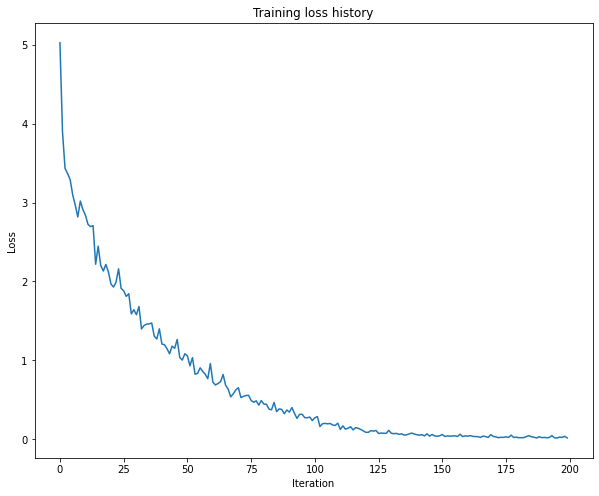

In [16]:
torch.manual_seed(231)
np.random.seed(231)

data = load_coco_data(max_train=50)

transformer = CaptioningTransformer(
          word_to_idx=data['word_to_idx'],
          input_dim=data['train_features'].shape[1],
          wordvec_dim=256,
          num_heads=2,
          num_layers=2,
          max_length=30
        )


transformer_solver = CaptioningSolverTransformer(transformer, data, idx_to_word=data['idx_to_word'],
           num_epochs=100,
           batch_size=25,
           learning_rate=0.001,
           verbose=True, print_every=10,
         )

transformer_solver.train()

# Plot the training losses.
plt.plot(transformer_solver.loss_history)
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.title('Training loss history')
plt.show()

Print final training loss. You should see a final loss of less than 0.03.

In [17]:
print('Final loss: ', transformer_solver.loss_history[-1])

Final loss:  0.019332446


# (7) Transformer Sampling at Test Time[2pts]
The sampling code has been written for you. You can simply run the following to compare with the previous results with the RNN. As before the training results should be much better than the validation set results, given how little data we trained on.

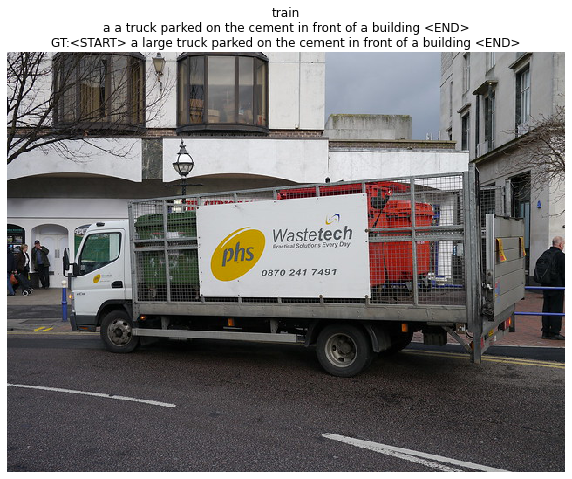

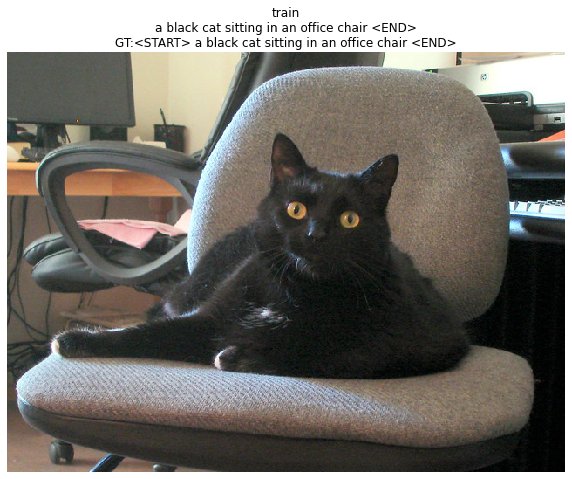

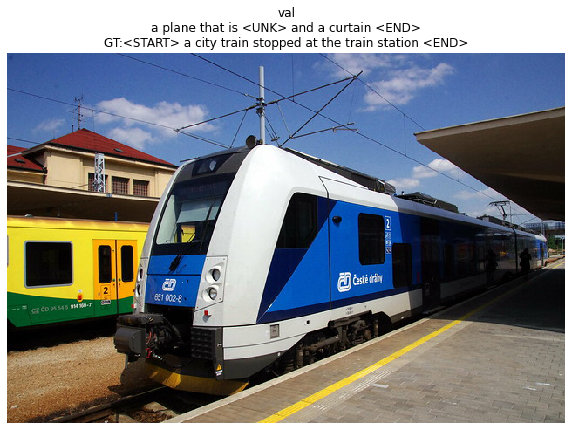

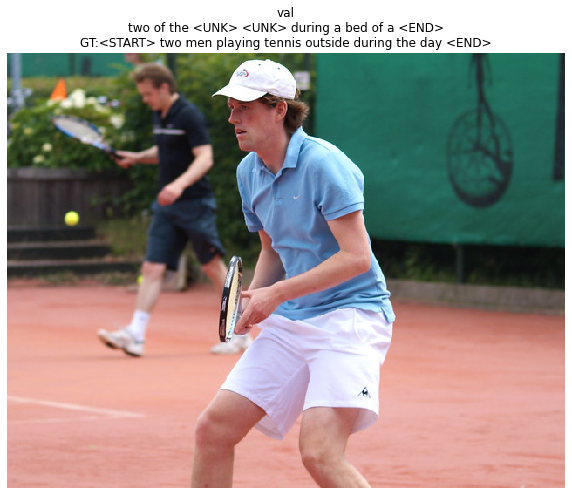

In [21]:
# If you get an error, the URL just no longer exists, so don't worry!
# You can re-sample as many times as you want.
for split in ['train', 'val']:
    minibatch = sample_coco_minibatch(data, split=split, batch_size=2)
    gt_captions, features, urls = minibatch
    gt_captions = decode_captions(gt_captions, data['idx_to_word'])

    sample_captions = transformer.sample(features, max_length=30)
    sample_captions = decode_captions(sample_captions, data['idx_to_word'])

    for gt_caption, sample_caption, url in zip(gt_captions, sample_captions, urls):
        img = image_from_url(url)
        # Skip missing URLs.
        if img is None: continue
        plt.imshow(img)            
        plt.title('%s\n%s\nGT:%s' % (split, sample_caption, gt_caption))
        plt.axis('off')
        plt.show()

# Section B: Image Captioning with CLIP and LM

**In this section, there are a total of 9 steps, with a total score of 40 points.**

[CLIP](https://github.com/openai/CLIP) (Contrastive Language–Image Pretraining) is a multimodal pretraining model proposed by OpenAI, combining image and text modalities to achieve robust cross-modal understanding capabilities.

Language models (LM) are core tools in natural language processing (NLP), aiming to understand and generate text consistent with linguistic rules. They model language sequences in a probabilistic form, predicting the likelihood of words or tokens in a text.

Among them, [GPT-2](https://huggingface.co/openai-community/gpt2) (Generative Pre-trained Transformer 2) is a language generation model released by OpenAI in 2019. It is the second generation in the GPT (Generative Pre-trained Transformer) series and demonstrates strong capabilities in tasks such as text generation, summarization, and translation.



## (1) Motivation:
In the section, can the cross-modal understanding capability of **CLIP** be combined with the text generation capability of language models to achieve both accurate image understanding and expressive language generation?

![frame](./img/framework.png)

Given a dataset of paired images and captions $\{x^i, c^i\}_{i=1}^{N}$, our objective is to learn to generate a meaningful caption for an unseen input image. Each caption is represented as a sequence of tokens $c^i = c^i_1, \ldots, c^i_\ell$, padded to a maximum length $\ell$. The training objective is defined as:

$$
\max_\theta \sum_{i=1}^{N} \log p_\theta (c^i_1, \ldots, c^i_\ell \mid x^i),
$$

where $\theta$ denotes the trainable parameters of the model.

Our key idea is to leverage the rich semantic embeddings provided by CLIP, which encapsulate essential visual information. These embeddings are used as a prefix to condition the caption generation. By encoding the required semantic information in this prefix, we employ an autoregressive language model to predict each token in the caption sequentially without relying on future tokens. The revised objective becomes:

$$
\max_\theta \sum_{i=1}^{N}\sum_{j=1}^{\ell} \log p_\theta (c^i_j \mid x^i, c^i_1, \ldots, c^i_{j-1}).
$$

Specifically, we use GPT-2 as the language model and its tokenizer to transform captions into sequences of embeddings. To extract visual features from an image $x^i$, we use the visual encoder of a pre-trained CLIP model. A lightweight mapping network $F$ then maps the CLIP visual embeddings into $k$ embedding vectors:

$$
p^i_1, \ldots, p^i_k = F(\text{CLIP}(x^i)),
$$

where each vector $p^i_j$ has the same dimensionality as a word embedding. These visual embeddings are concatenated with the caption embeddings to form:

$$
Z^i = p^i_1, \ldots, p^i_k, c^i_1, \ldots, c^i_\ell.
$$

During training, the language model is fed the concatenated prefix-caption embeddings $\\{Z^i\\}_{i=1}^{N}$. The objective is to predict the caption tokens conditioned on the prefix in an autoregressive manner. To achieve this, the mapping network $F$ is trained using a simple yet effective cross-entropy loss:

$$
\mathcal{L}_{X} = -\sum_{i=1}^{N}\sum_{j=1}^{\ell} \log p_\theta (c^i_j \mid p^i_1, \ldots, p^i_k, c^i_1, \ldots, c^i_{j-1}).
$$

## (2) Dependencies

Please refer to `mml/requirements.txt` for the list of required dependencies.

## (3) Dataset Download
Download [train_captions](https://drive.google.com/file/d/1D3EzUK1d1lNhD2hAvRiKPThidiVbP2K_/view?usp=sharing) to `mml/data/coco/annotations`.

Download [training images](http://images.cocodataset.org/zips/train2014.zip) and [validation images](http://images.cocodataset.org/zips/val2014.zip) and unzip (We use Karpathy et el. split).


## (4)Dataset Implementation [10 pts]

Please implement the ImageCaptionDataset (line 20) in `mml/data/dataset.py` and the **collate function** (line 26) for the dataloader.

*Hint:* Here, you can choose to preprocess the images into features using pretrained-CLIP, or handle the images in the `dataset` or `collate function`.

## (5) Dataset Usage [5pts]
Please complete the specific instances of `ImageCaptionDataset` in `mml/evaluate.py` (line 109) and `mml/training.py` (line 50) based on your implemented dataset.

## (6)Model Train[5pts]

You also need to complete a training loop before training. Refer to `mml/model/trainer.py` (line 71).

**Note**: The training launcher is primarily `mml/training.py`, which requires two input arguments: the name of the checkpoint to save and the model size (two options: `S` and `L`, with configuration differences detailed in `mml/utils/config.py`).

In [ ]:
parser.add_argument(
    "-C", "--checkpoint-name", type=str, default="", help="Checkpoint name"
)

parser.add_argument(
    "-S",
    "--size",
    type=str,
    default="S",
    help="Model size [S, L]",
    choices=["S", "L", "s", "l"],
)

## Origin Model

### Path

- 下载模型放置在 `models` 中
    - 由于服务器无法访问 huggingface, 代码中全部使用本地路径加载模型
    - 如果要进行运行, 需要全部修改
- 图片数据放置在 `datasets` 中，caption meta data 也在其中
- CLIP 提取的模型特征放置在 `cache` 中
- 模型的参数保存在 `results/weights` 中

相关的模型参数保存在

- https://disk.pku.edu.cn/link/AA5428384A90834DF597EABEDF1FF48334
- 文件夹名：MML-Assignment3
- 有效期限：2025-02-28 23:09

### Image Feature Cache

- `mml/get_image_cache.py` 用于提取并且保存 image feature
- 同时还筛选有对应图片的合法训练数据，需要重命名为 `train_caption_filtered.json`
- `get_image_cache.py` 运行的参数请具体参考代码
- 需要首先提取 image feature 训练代码才能正常运行

### Dataset

`ImageCaptionDataset` 返回的格式为 `(image_name, image_id, caption)`

- `image_name`: 图片的完整名称
- `image_id`: 图片的 id, 根据 id 从 image cache 中提取 feature
- `caption`: 图片对应的 caption string

### Dataloader

`get_loader` 返回的格式为 `(img_embs, input_ids, attention_mask)`

- 调用 `cl_fn` 对于 batch 数据进行处理
- tokenizer 使用 `batch_encode_plus` 获取 `input_ids` 和 `attention_mask`
- 根据 `image_id` 从 cache 中获取 `img_embs`
- 对于 `get_loader` 添加了额外的参数

### Training Results

- clip-vit-base-patch32+gpt2 (GPT2+SCLIP)
    - valid loss 最低为 0.594, 出现在 epoch 15
    - train loss 最低为 0.436, 出现在 epoch 30
- clip-vit-large-patch14+gpt2-medium (GPT2M+LCLIP)
    - valid loss 最低为 0.582, 出现在 epoch 10
    - train loss 最低为 0.48, 出现在 epoch 13

![截屏2024-12-31 22.00.50.png](<attachment:截屏2024-12-31 22.00.50.png>)
![截屏2024-12-31 22.01.00.png](<attachment:截屏2024-12-31 22.01.00.png>)

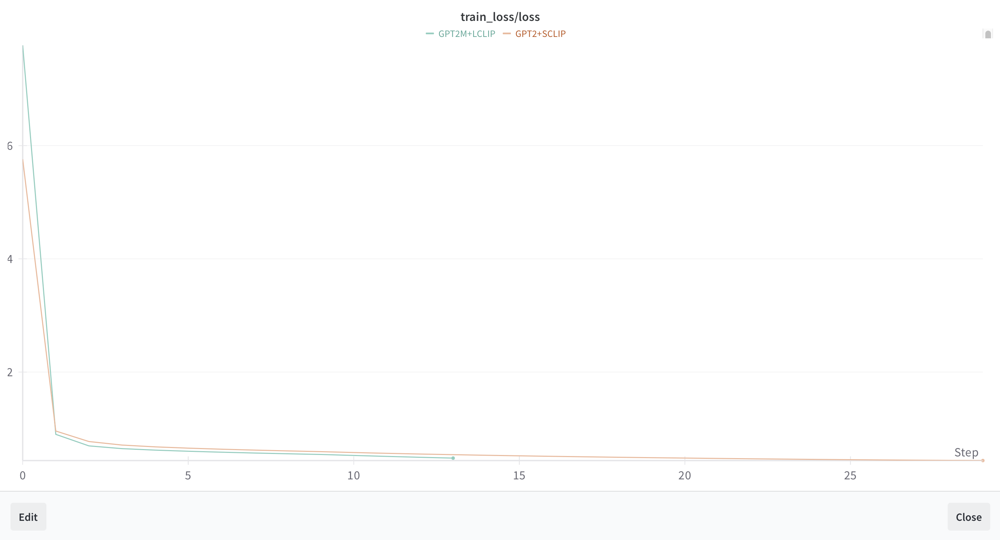
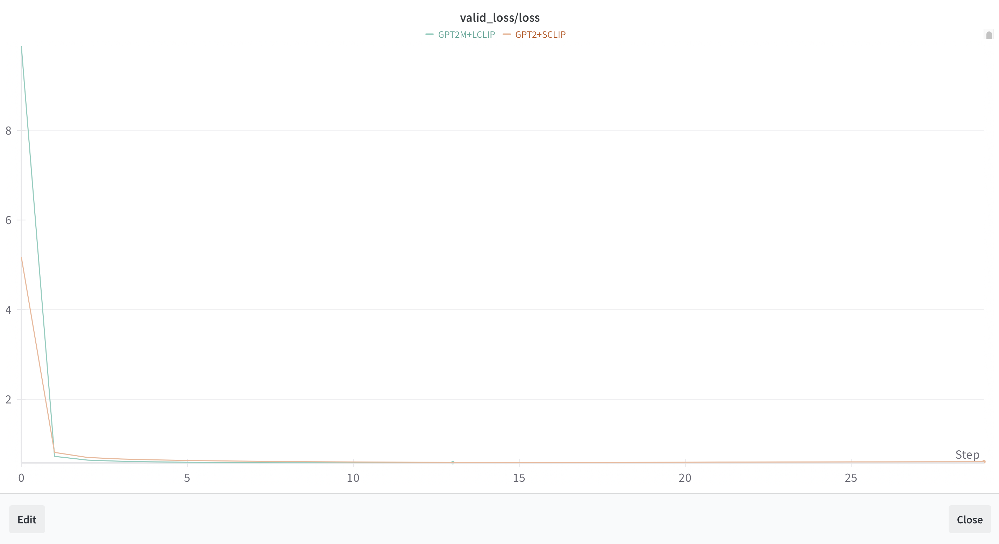

## (7)  Visualization [5pts]  
Please run `mml/evaluate.py` and save **5 visualization results** (images + generated captions).

可以使用 `evaluate.sh` 进行快速的可视化, 但是需要修改对应路径, 并且将模型保存到指定位置

### clip-vit-large-patch14+gpt2-medium epoch 9

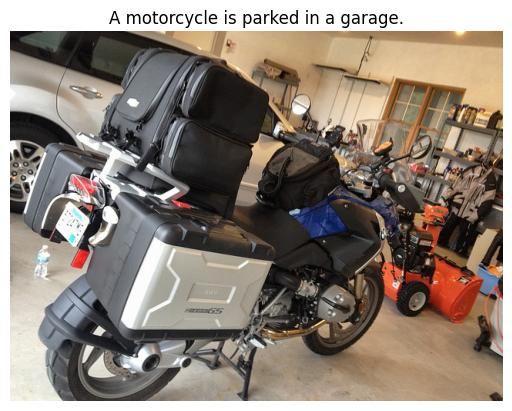
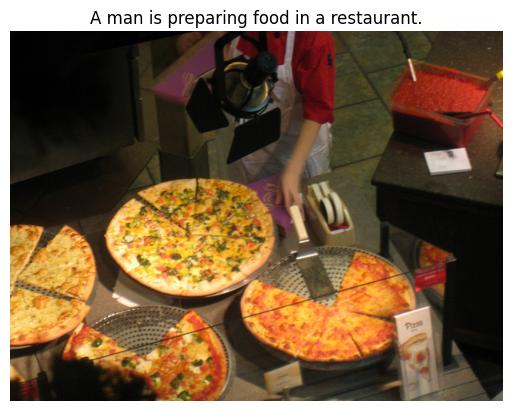
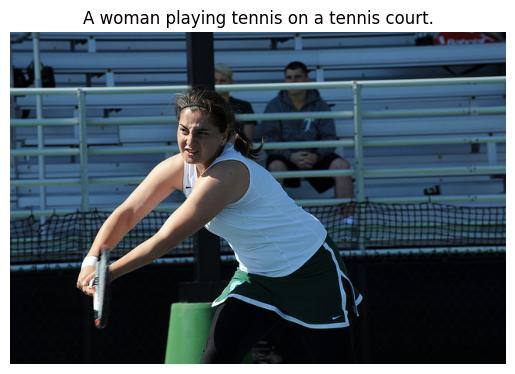
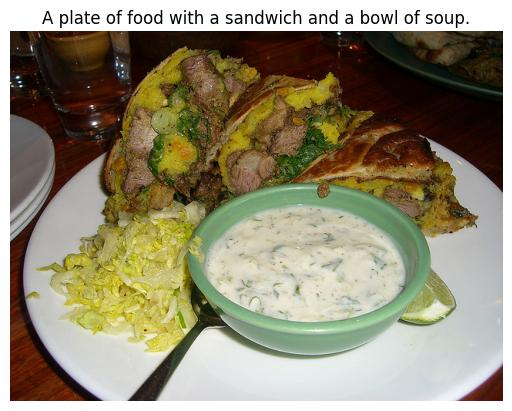
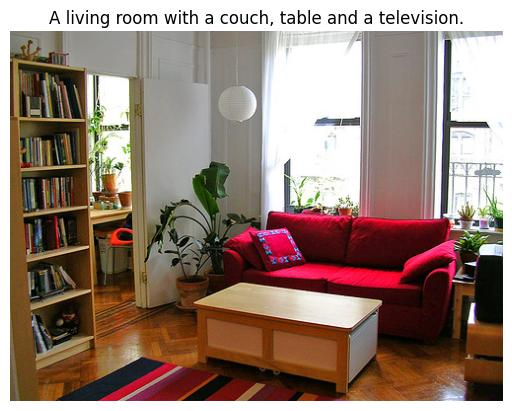

## (8) Further Improvements?  [10pts]
Modern large language models (LLMs) have demonstrated stronger text generation capabilities compared to GPT-2.  
Can you replace GPT-2 with a more powerful LLM (e.g., [Qwen2.5-0.5B](https://hf-mirror.com/Qwen/Qwen2.5-0.5B)) to enhance the performance of the Image Captioning model?  

## (9) Improvement Description [5pts]
Please describe your specific improvements below, including what functionalities were implemented in which files, and the results after the improvements:

## Qwen2.5 Imporvment

使用 Qwen2.5-0.5B 替换 GPT2 作为 text encoder, 使用 `Qwen2Tokenizer` 和 `Qwen2ForCausalLM` 替代 `GPT2Tokenizer` 和 `GPT2LMHeadModel`, 对于相关的衔接代码进行修改。

由于 CLIP hidden_dim 和 Qwen2.5 hidden_dim 不同, 所以 MLP Projector 需要将 image_embs 映射到 ep_len 个 text_embs 再进行划分。

Qwen2.5 在输入时只进行了 word embedding, 没有在输入时进行 position embedding, 所以也需要对于代码逻辑进行修改。

相关的代码放置在 `mml_Qwen` 中。


## Q-Former Imporvment

原本的 Projector 对于单个 image token 进行 transformer encode, 然后通过 MLP 投影到 ep_len 个 text tokens, Projector 的信息提取能力较差, image modality 不能很好的对齐到 text modality, 导致 LLM backnone 无法理解 image 中信息, 且会出现幻觉问题。

使用 Q-Former 通过 query tokens 从 image token 中提取信息。

在 `model.py` 中定义 `QFormerDecoderLayer`, 结构和 Transformer Decoder 类似, 使用了 self attention 和 cross attention。然后定义 `QFormerMapping`, 定义 trainable queries, 将 image token 作为每层 `QFormerDecoderLayer` 固定的 key/value。最后对于输出的每个 token 使用 MLP 单独投影到 text token 的维度。

相关的代码放置在 `mml_QFormer` 中。

## Resutls

- 实际上两种改进对于最低的 valid loss 影响都不大
- 几种方法最终最低的 valid loss 基本都在 0.58~0.60 的区间中

![截屏2024-12-31 21.58.38.png](<attachment:截屏2024-12-31 21.58.38.png>)
![截屏2024-12-31 21.58.53.png](<attachment:截屏2024-12-31 21.58.53.png>)

**但是使用更强的 text model, 在语言表达能力上会更强**
**使用 QFormer 之后能够一定程度减少幻觉, 使得 LLM backbone 更好的理解图像中信息**

当然以下的对比是在 epoch6 时进行的, 此时的对比比较明显, 如果增加训练的时间, 原始的模型还是没有如此明显的幻觉。也可以说是改进后的模型在更短的训练时间内达到了更好的训练效果

### Qwen+LCLIP+QFormer

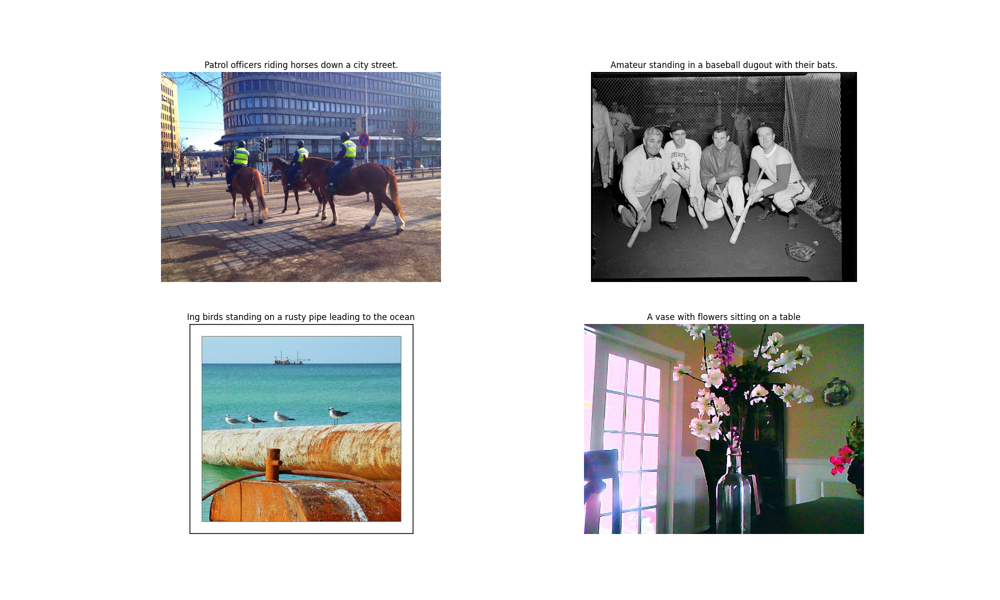


### GPT2M+LCIP

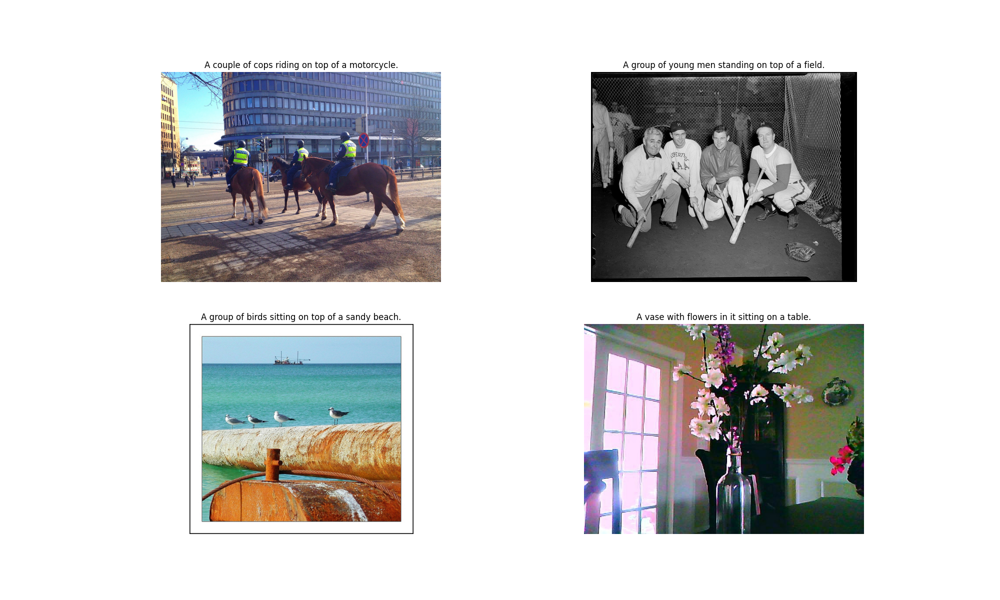

### Qwen+SCLIP

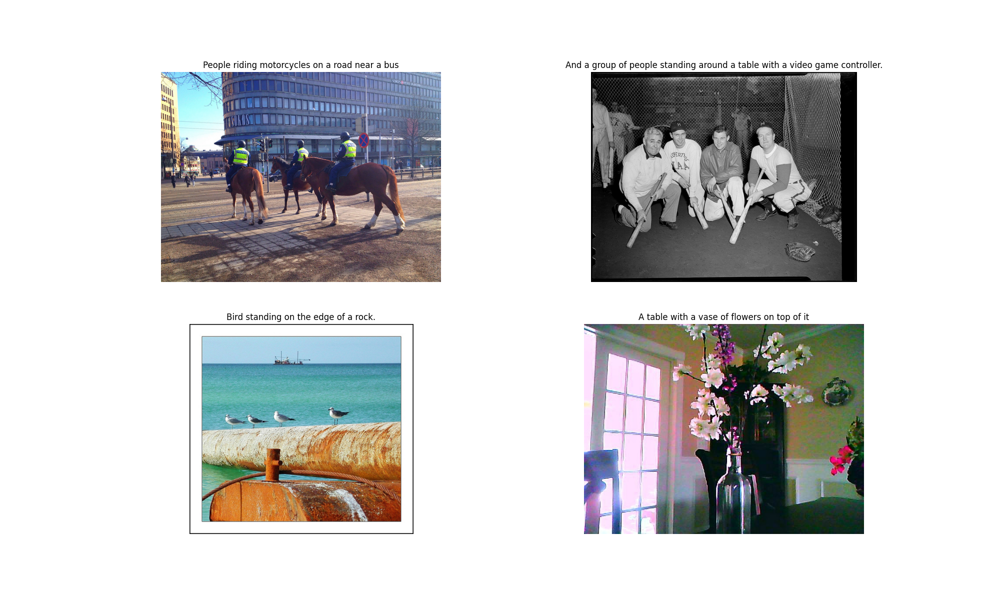



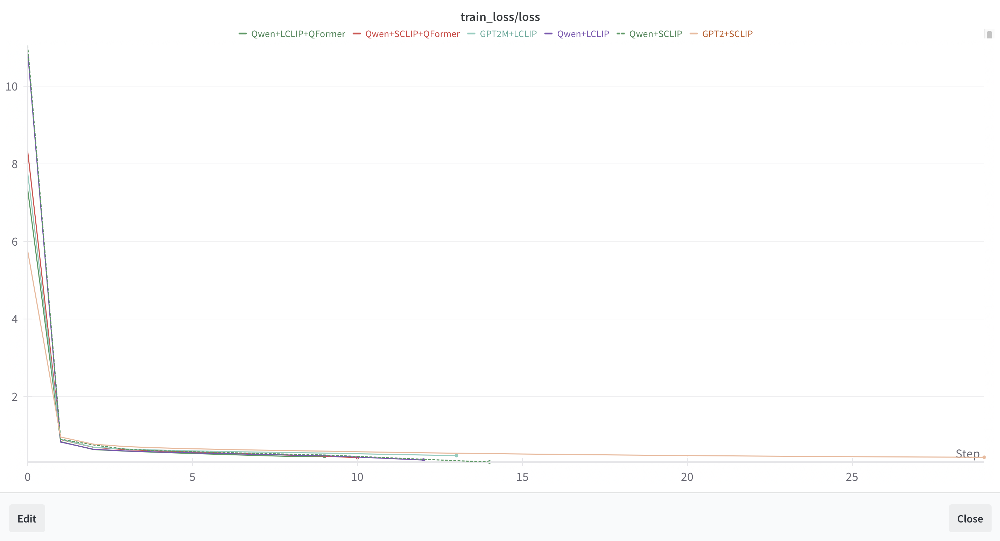
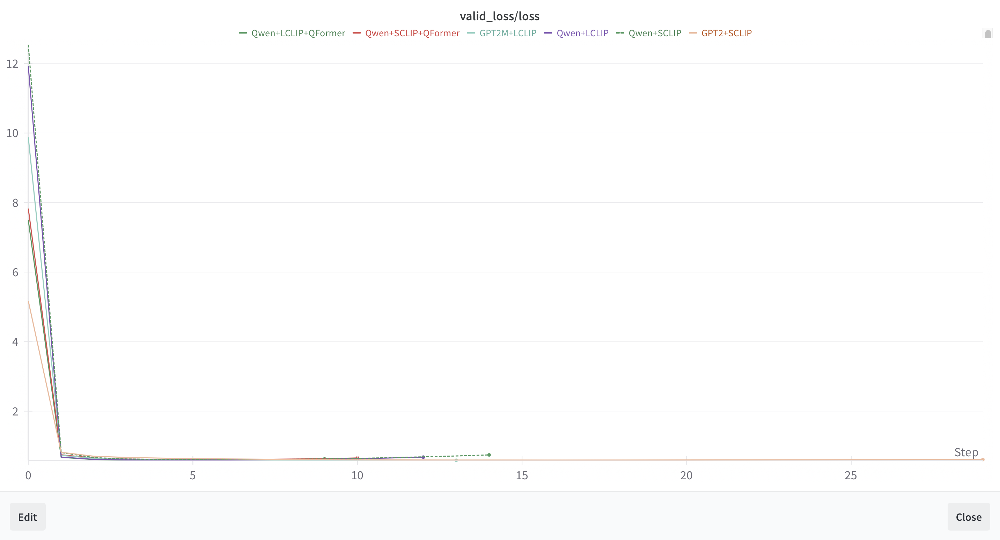